# Класифікація Food-101: 3 класи
## Індекси класів: 18, 48, 78

## 1. Імпорт бібліотек та монтування диску для гугл колаб

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import json

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2, EfficientNetB0
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(f"TensorFlow version: {tf.__version__}")
print(f"GPU available: {tf.config.list_physical_devices('GPU')}")

TensorFlow version: 2.19.0
GPU available: []


## 2. Налаштування параметрів

In [ ]:
DATASET_PATH = "/content/drive/MyDrive/101_food_classes_10_percent"  

CLASS_INDICES = [18, 48, 78]

IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 30
LEARNING_RATE = 0.001

VALIDATION_SPLIT = 0.2

TRAIN_PATH = os.path.join(DATASET_PATH, 'train')
TEST_PATH = os.path.join(DATASET_PATH, 'test')

print(f"Шлях до датасету: {DATASET_PATH}")
print(f"Шлях до train: {TRAIN_PATH}")
print(f"Шлях до test: {TEST_PATH}")
print(f"\nКласи для класифікації (індекси): {CLASS_INDICES}")

Шлях до датасету: /content/drive/MyDrive/101_food_classes_10_percent
Шлях до train: /content/drive/MyDrive/101_food_classes_10_percent/train
Шлях до test: /content/drive/MyDrive/101_food_classes_10_percent/test

Класи для класифікації (індекси): [18, 48, 78]


## 3. Завантаження списку класів

In [ ]:
all_classes = sorted([d for d in os.listdir(TRAIN_PATH)
                      if os.path.isdir(os.path.join(TRAIN_PATH, d))])

print(f"Всього класів у датасеті: {len(all_classes)}")
print(f"\nПерші 10 класів: {all_classes[:10]}")

selected_classes = [all_classes[i] for i in CLASS_INDICES]

print("\n" + "="*60)
print("ВИБРАНІ КЛАСИ ДЛЯ КЛАСИФІКАЦІЇ:")
print("="*60)
for idx, class_name in zip(CLASS_INDICES, selected_classes):
    print(f"  Індекс {idx:2d}: {class_name}")
print("="*60)

class_to_idx = {class_name: i for i, class_name in enumerate(selected_classes)}
idx_to_class = {i: class_name for i, class_name in enumerate(selected_classes)}

print(f"\nКількість класів для навчання: {len(selected_classes)}")

Всього класів у датасеті: 101

Перші 10 класів: ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito']

ВИБРАНІ КЛАСИ ДЛЯ КЛАСИФІКАЦІЇ:
  Індекс 18: chicken_curry
  Індекс 48: greek_salad
  Індекс 78: poutine

Кількість класів для навчання: 3


## 4. Підрахунок зображень

In [5]:
def count_images_in_folder(base_path, class_name):
    """Рахує кількість зображень у папці класу"""
    class_path = os.path.join(base_path, class_name)
    if not os.path.exists(class_path):
        return 0
    return len([f for f in os.listdir(class_path)
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))])

print("\n" + "="*70)
print("РОЗПОДІЛ ДАНИХ ПО КЛАСАХ")
print("="*70)
print(f"{'Клас':<25} {'Train':<12} {'Test':<12} {'Разом':<12}")
print("-"*70)

total_train = 0
total_test = 0

for class_name in selected_classes:
    train_count = count_images_in_folder(TRAIN_PATH, class_name)
    test_count = count_images_in_folder(TEST_PATH, class_name)
    total = train_count + test_count

    total_train += train_count
    total_test += test_count

    print(f"{class_name:<25} {train_count:<12} {test_count:<12} {total:<12}")

print("-"*70)
print(f"{'РАЗОМ:':<25} {total_train:<12} {total_test:<12} {total_train + total_test:<12}")
print("="*70)

print(f"\nДеталі:")
print(f"  • Тренувальних зображень: {total_train}")
print(f"  • Тестових зображень: {total_test}")
print(f"  • Загалом: {total_train + total_test}")


РОЗПОДІЛ ДАНИХ ПО КЛАСАХ
Клас                      Train        Test         Разом       
----------------------------------------------------------------------
chicken_curry             75           250          325         
greek_salad               75           250          325         
poutine                   75           250          325         
----------------------------------------------------------------------
РАЗОМ:                    225          750          975         

Деталі:
  • Тренувальних зображень: 225
  • Тестових зображень: 750
  • Загалом: 975


## 5. Створення генераторів даних

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=VALIDATION_SPLIT
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    TRAIN_PATH,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    classes=selected_classes,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

validation_generator = train_datagen.flow_from_directory(
    TRAIN_PATH,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    classes=selected_classes,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    TEST_PATH,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    classes=selected_classes,
    class_mode='categorical',
    shuffle=False
)

print("\n" + "="*70)
print("ГЕНЕРАТОРИ ДАНИХ СТВОРЕНО")
print("="*70)
print(f"Тренувальних батчів: {len(train_generator)}")
print(f"Валідаційних батчів: {len(validation_generator)}")
print(f"Тестових батчів: {len(test_generator)}")
print(f"\nТренувальних зображень: {train_generator.samples}")
print(f"Валідаційних зображень: {validation_generator.samples}")
print(f"Тестових зображень: {test_generator.samples}")
print("="*70)

Found 180 images belonging to 3 classes.
Found 45 images belonging to 3 classes.
Found 750 images belonging to 3 classes.

ГЕНЕРАТОРИ ДАНИХ СТВОРЕНО
Тренувальних батчів: 6
Валідаційних батчів: 2
Тестових батчів: 24

Тренувальних зображень: 180
Валідаційних зображень: 45
Тестових зображень: 750


## 6. Візуалізація прикладів даних

Приклади тренувальних зображень:



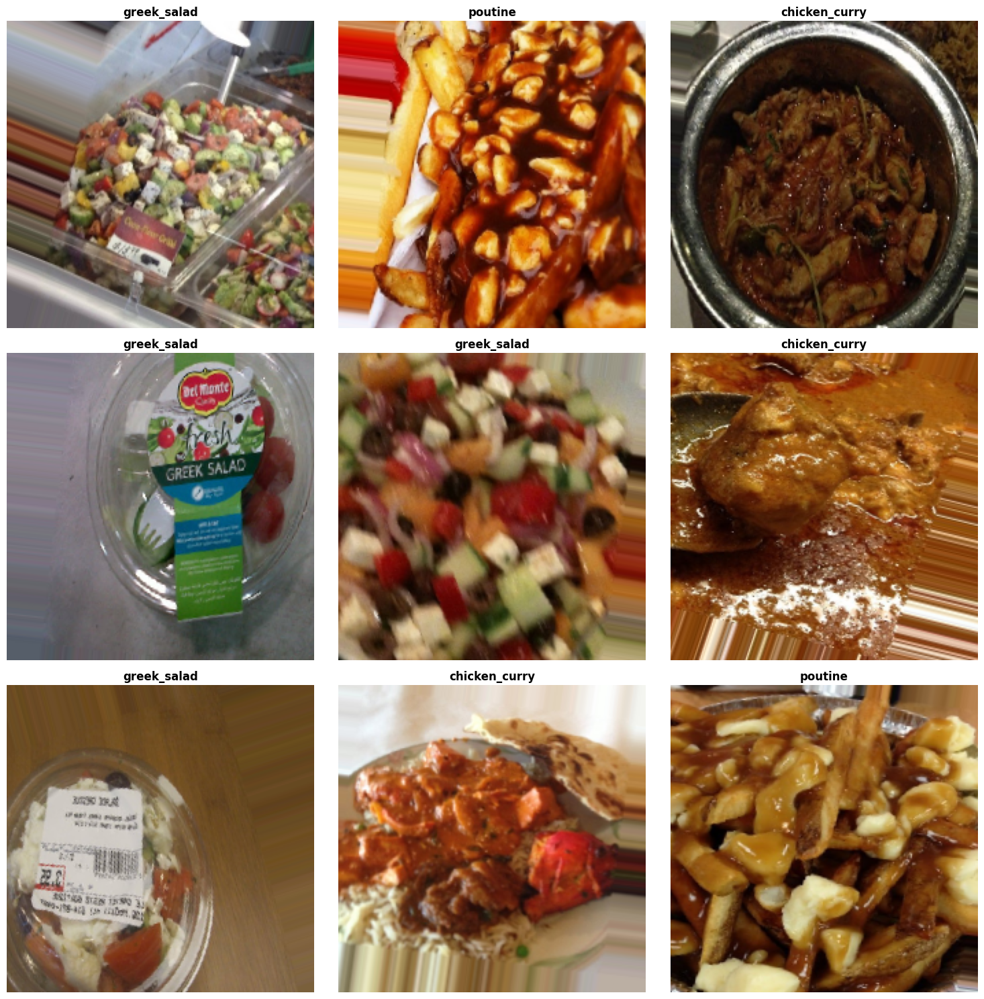

In [ ]:
def show_batch(generator, num_images=9):
    x_batch, y_batch = next(generator)

    plt.figure(figsize=(15, 15))
    for i in range(min(num_images, len(x_batch))):
        plt.subplot(3, 3, i + 1)
        plt.imshow(x_batch[i])
        class_idx = np.argmax(y_batch[i])
        plt.title(f"{idx_to_class[class_idx]}", fontsize=12, fontweight='bold')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

print("Приклади тренувальних зображень:\n")
show_batch(train_generator)

## 7. Створення моделі (Transfer Learning)

In [ ]:
def create_model(num_classes=3, img_size=224):

    base_model = MobileNetV2(
        input_shape=(img_size, img_size, 3),
        include_top=False,
        weights='imagenet'
    )

    base_model.trainable = False

    model = models.Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(256, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
        layers.Dense(num_classes, activation='softmax')
    ])

    return model, base_model

model, base_model = create_model(num_classes=len(selected_classes), img_size=IMG_SIZE)

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=LEARNING_RATE),
    loss='categorical_crossentropy',
    metrics=['accuracy', keras.metrics.TopKCategoricalAccuracy(k=2, name='top_2_accuracy')]
)

print("\n" + "="*70)
print("АРХІТЕКТУРА МОДЕЛІ")
print("="*70)
model.summary()
print("="*70)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

АРХІТЕКТУРА МОДЕЛІ


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           771 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,592,835 (9.89 MB)

 Trainable params: 331,779 (1.27 MB)

 Non-trainable params: 2,261,056 (8.63 MB)

## 8. Callbacks для навчання

In [ ]:
models_dir = 'models'
os.makedirs(models_dir, exist_ok=True)

callbacks = [
    EarlyStopping(
        monitor='val_accuracy',
        patience=5,
        restore_best_weights=True,
        verbose=1
    ),

    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-7,
        verbose=1
    ),

    ModelCheckpoint(
        os.path.join(models_dir, 'best_model.h5'),
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

print("✓ Callbacks налаштовані")
print(f"✓ Моделі будуть зберігатися в папці: {models_dir}/")

✓ Callbacks налаштовані
✓ Моделі будуть зберігатися в папці: models/


## 9. Навчання моделі - Phase 1 (заморожена базова модель)

In [10]:
print("\n" + "="*70)
print("PHASE 1: НАВЧАННЯ З ЗАМОРОЖЕНОЮ БАЗОВОЮ МОДЕЛЛЮ")
print("="*70)
print("Навчаємо тільки нові класифікаційні шари...\n")

history_phase1 = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=EPOCHS,
    callbacks=callbacks,
    verbose=1
)

print("\n" + "="*70)
print("✓ PHASE 1 ЗАВЕРШЕНО!")
print("="*70)


PHASE 1: НАВЧАННЯ З ЗАМОРОЖЕНОЮ БАЗОВОЮ МОДЕЛЛЮ
Навчаємо тільки нові класифікаційні шари...



/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.4491 - loss: 1.5573 - top_2_accuracy: 0.7191 
Epoch 1: val_accuracy improved from -inf to 0.71111, saving model to models/best_model.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 100s 16s/step - accuracy: 0.4651 - loss: 1.5034 - top_2_accuracy: 0.7298 - val_accuracy: 0.7111 - val_loss: 0.6367 - val_top_2_accuracy: 0.9111 - learning_rate: 0.0010
Epoch 2/30
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8051 - loss: 0.4672 - top_2_accuracy: 0.9551
Epoch 2: val_accuracy improved from 0.71111 to 0.82222, saving model to models/best_model.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step - accuracy: 0.8084 - loss: 0.4721 - top_2_accuracy: 0.9552 - val_accuracy: 0.8222 - val_loss: 0.5601 - val_top_2_accuracy: 0.9111 - learning_rate: 0.0010
Epoch 3/30
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8925 - loss: 0.2650 - top_2_accuracy: 0.9588
Epoch 3: val_accuracy did not improve from 0.82222
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step - accuracy: 0.8912 - loss: 0.2704 - top_2_accuracy: 0.9591 - val_accuracy: 0.7333 - val_loss: 0.6169 - val_top_2_accuracy: 0.8889 - learning_rate: 0.0010
Epoch 4/30
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8998 - loss: 0.3530 - top_2_accuracy: 0.9754
Epoch 4: val_accuracy did not improve from 0.82222
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step - accuracy: 0.8998 - loss: 0.3448 - top_2_accuracy: 0.9757 - val_accuracy: 0.8222 - val_loss: 0.5045 - val_top_2_accuracy: 0.9556 - learning_rate: 0.0010
Epoch 5/30
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9134 - loss: 0.2274 - top_2_accuracy: 0.9829
Epoch 5

6/6 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.9468 - loss: 0.1306 - top_2_accuracy: 0.9984 - val_accuracy: 0.8444 - val_loss: 0.6139 - val_top_2_accuracy: 0.8667 - learning_rate: 0.0010
Epoch 7/30
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9187 - loss: 0.2346 - top_2_accuracy: 0.9930
Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 7: val_accuracy did not improve from 0.84444
6/6 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - accuracy: 0.9184 - loss: 0.2391 - top_2_accuracy: 0.9924 - val_accuracy: 0.8000 - val_loss: 0.5788 - val_top_2_accuracy: 0.8889 - learning_rate: 0.0010
Epoch 8/30
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9329 - loss: 0.2071 - top_2_accuracy: 0.9870
Epoch 8: val_accuracy did not improve from 0.84444
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step - accuracy: 0.9330 - loss: 0.2087 - top_2_accuracy: 0.9880 - val_accuracy: 0.8222 - val_loss: 0.4936 - val_top_2_accuracy: 0.9111 - learning_rate: 5.0000e-04
Epoch 9/30
6/6 ━━━━━━━━━━━━━━━━━

## 10. Fine-tuning - Phase 2 (розморожуємо частину базової моделі)

In [ ]:
print("\n" + "="*70)
print("PHASE 2: FINE-TUNING")
print("="*70)

base_model.trainable = True

for layer in base_model.layers[:-30]:
    layer.trainable = False

print(f"Trainable layers: {sum([1 for layer in model.layers if layer.trainable])}")

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=LEARNING_RATE/10),
    loss='categorical_crossentropy',
    metrics=['accuracy', keras.metrics.TopKCategoricalAccuracy(k=2, name='top_2_accuracy')]
)

print("Розпочинаємо fine-tuning...\n")

history_phase2 = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=15,
    callbacks=callbacks,
    verbose=1
)

print("\n" + "="*70)
print("✓ PHASE 2 ЗАВЕРШЕНО!")
print("="*70)


PHASE 2: FINE-TUNING
Trainable layers: 8
Розпочинаємо fine-tuning...

Epoch 1/15
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8949 - loss: 0.3279 - top_2_accuracy: 0.9981
Epoch 1: val_accuracy did not improve from 0.84444
6/6 ━━━━━━━━━━━━━━━━━━━━ 34s 4s/step - accuracy: 0.8917 - loss: 0.3426 - top_2_accuracy: 0.9968 - val_accuracy: 0.8000 - val_loss: 0.5005 - val_top_2_accuracy: 0.9333 - learning_rate: 1.0000e-04
Epoch 2/15
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8442 - loss: 0.4282 - top_2_accuracy: 0.9661
Epoch 2: val_accuracy did not improve from 0.84444
6/6 ━━━━━━━━━━━━━━━━━━━━ 36s 3s/step - accuracy: 0.8482 - loss: 0.4220 - top_2_accuracy: 0.9678 - val_accuracy: 0.7778 - val_loss: 0.4861 - val_top_2_accuracy: 0.9333 - learning_rate: 1.0000e-04
Epoch 3/15
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9205 - loss: 0.2108 - top_2_accuracy: 0.9937
Epoch 3: val_accuracy did not improve from 0.84444
6/6 ━━━━━━━━━━━━━━━━━━━━ 16s 3s/step - accuracy: 0.9191 - loss: 0.21

## 11. Візуалізація результатів навчання

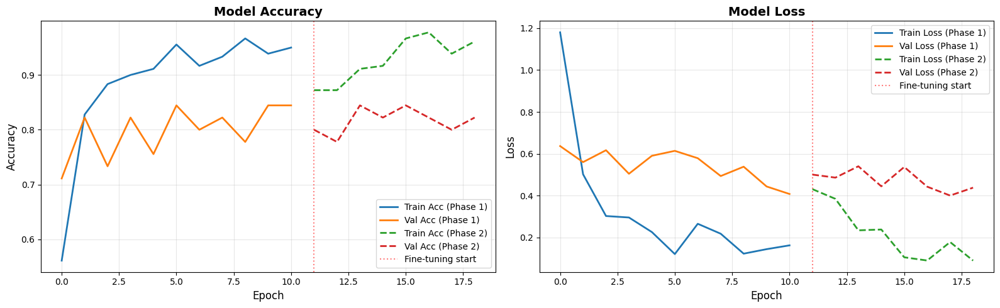

In [ ]:
def plot_training_history(history1, history2=None):
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))

    axes[0].plot(history1.history['accuracy'], label='Train Acc (Phase 1)', linewidth=2)
    axes[0].plot(history1.history['val_accuracy'], label='Val Acc (Phase 1)', linewidth=2)

    if history2:
        offset = len(history1.history['accuracy'])
        epochs2 = range(offset, offset + len(history2.history['accuracy']))
        axes[0].plot(epochs2, history2.history['accuracy'],
                    label='Train Acc (Phase 2)', linewidth=2, linestyle='--')
        axes[0].plot(epochs2, history2.history['val_accuracy'],
                    label='Val Acc (Phase 2)', linewidth=2, linestyle='--')
        axes[0].axvline(x=offset, color='red', linestyle=':', alpha=0.5, label='Fine-tuning start')

    axes[0].set_xlabel('Epoch', fontsize=12)
    axes[0].set_ylabel('Accuracy', fontsize=12)
    axes[0].set_title('Model Accuracy', fontsize=14, fontweight='bold')
    axes[0].legend(loc='lower right')
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(history1.history['loss'], label='Train Loss (Phase 1)', linewidth=2)
    axes[1].plot(history1.history['val_loss'], label='Val Loss (Phase 1)', linewidth=2)

    if history2:
        axes[1].plot(epochs2, history2.history['loss'],
                    label='Train Loss (Phase 2)', linewidth=2, linestyle='--')
        axes[1].plot(epochs2, history2.history['val_loss'],
                    label='Val Loss (Phase 2)', linewidth=2, linestyle='--')
        axes[1].axvline(x=offset, color='red', linestyle=':', alpha=0.5, label='Fine-tuning start')

    axes[1].set_xlabel('Epoch', fontsize=12)
    axes[1].set_ylabel('Loss', fontsize=12)
    axes[1].set_title('Model Loss', fontsize=14, fontweight='bold')
    axes[1].legend(loc='upper right')
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

plot_training_history(history_phase1, history_phase2)

## 12. Оцінка моделі на тестових даних

In [ ]:
model = keras.models.load_model(os.path.join(models_dir, 'best_model.h5'))

print("\n" + "="*70)
print("ОЦІНКА НА ТЕСТОВИХ ДАНИХ")
print("="*70)

test_loss, test_accuracy, test_top2_accuracy = model.evaluate(
    test_generator,
    verbose=1
)

print("\n" + "="*70)
print("ФІНАЛЬНІ РЕЗУЛЬТАТИ")
print("="*70)
print(f"Test Loss:          {test_loss:.4f}")
print(f"Test Accuracy:      {test_accuracy:.4f} ({test_accuracy*100:.2f}%)")
print(f"Test Top-2 Acc:     {test_top2_accuracy:.4f} ({test_top2_accuracy*100:.2f}%)")
print("="*70)


ОЦІНКА НА ТЕСТОВИХ ДАНИХ
24/24 ━━━━━━━━━━━━━━━━━━━━ 361s 15s/step - accuracy: 0.8467 - loss: 0.3856 - top_2_accuracy: 0.9776

ФІНАЛЬНІ РЕЗУЛЬТАТИ
Test Loss:          0.2777
Test Accuracy:      0.8947 (89.47%)
Test Top-2 Acc:     0.9840 (98.40%)


## 13. Матриця плутанини (Confusion Matrix)

24/24 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step


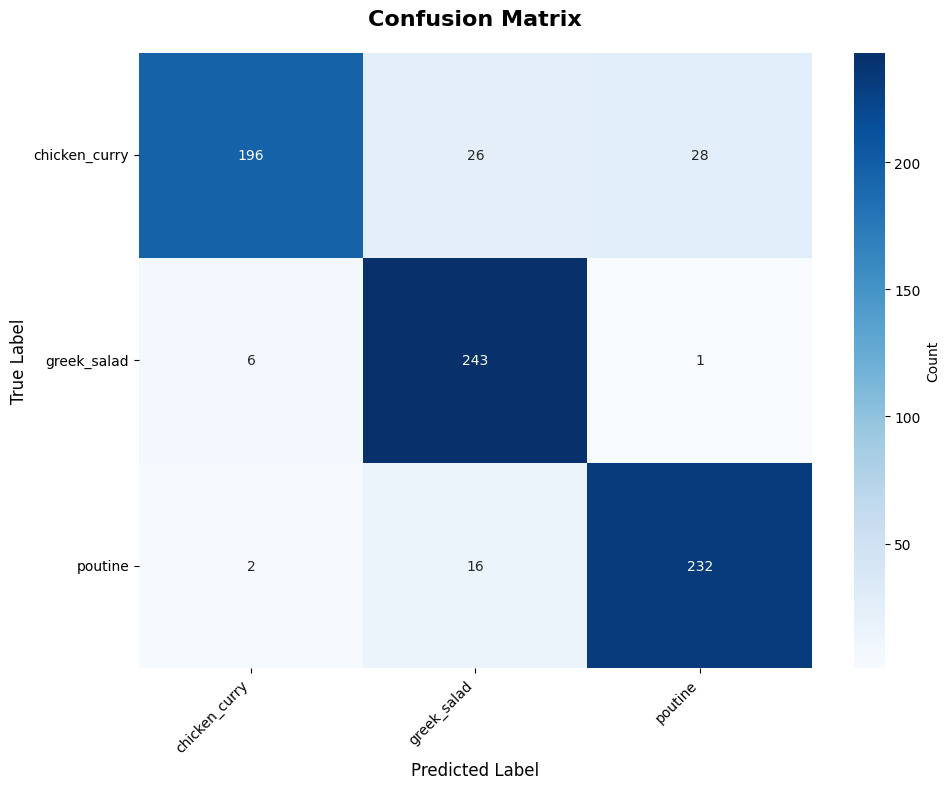

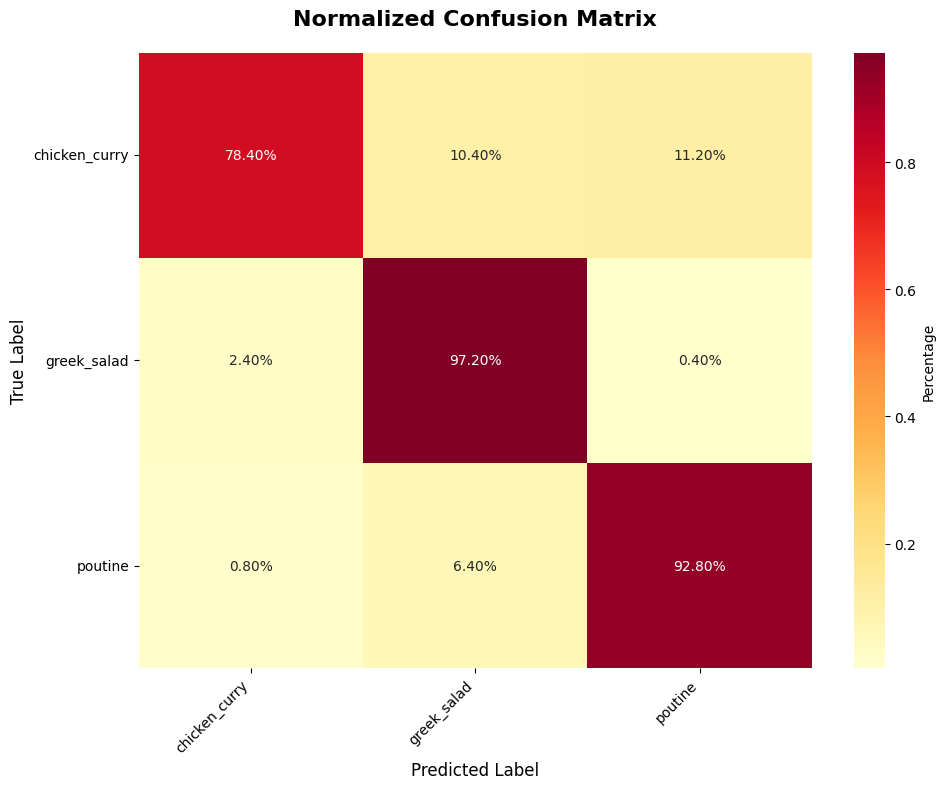

In [ ]:
test_generator.reset()
predictions = model.predict(test_generator, verbose=1)
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=selected_classes,
            yticklabels=selected_classes,
            cbar_kws={'label': 'Count'})
plt.title('Confusion Matrix', fontsize=16, fontweight='bold', pad=20)
plt.ylabel('True Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='YlOrRd',
            xticklabels=selected_classes,
            yticklabels=selected_classes,
            cbar_kws={'label': 'Percentage'})
plt.title('Normalized Confusion Matrix', fontsize=16, fontweight='bold', pad=20)
plt.ylabel('True Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## 14. Детальний звіт класифікації

In [ ]:
report = classification_report(y_true, y_pred,
                               target_names=selected_classes,
                               digits=4)

print("\n" + "="*70)
print("ДЕТАЛЬНИЙ ЗВІТ КЛАСИФІКАЦІЇ")
print("="*70)
print(report)

from sklearn.metrics import precision_recall_fscore_support

precision, recall, f1, support = precision_recall_fscore_support(y_true, y_pred)

print("\n" + "="*70)
print("МЕТРИКИ ПО КЛАСАХ")
print("="*70)
for i, class_name in enumerate(selected_classes):
    print(f"\n{class_name}:")
    print(f"  Precision: {precision[i]:.4f} ({precision[i]*100:.2f}%)")
    print(f"  Recall:    {recall[i]:.4f} ({recall[i]*100:.2f}%)")
    print(f"  F1-Score:  {f1[i]:.4f}")
    print(f"  Support:   {support[i]} зображень")
print("="*70)


ДЕТАЛЬНИЙ ЗВІТ КЛАСИФІКАЦІЇ
               precision    recall  f1-score   support

chicken_curry     0.9608    0.7840    0.8634       250
  greek_salad     0.8526    0.9720    0.9084       250
      poutine     0.8889    0.9280    0.9080       250

     accuracy                         0.8947       750
    macro avg     0.9008    0.8947    0.8933       750
 weighted avg     0.9008    0.8947    0.8933       750


МЕТРИКИ ПО КЛАСАХ

chicken_curry:
  Precision: 0.9608 (96.08%)
  Recall:    0.7840 (78.40%)
  F1-Score:  0.8634
  Support:   250 зображень

greek_salad:
  Precision: 0.8526 (85.26%)
  Recall:    0.9720 (97.20%)
  F1-Score:  0.9084
  Support:   250 зображень

poutine:
  Precision: 0.8889 (88.89%)
  Recall:    0.9280 (92.80%)
  F1-Score:  0.9080
  Support:   250 зображень


## 15. Візуалізація передбачень

Приклади передбачень на тестових даних:



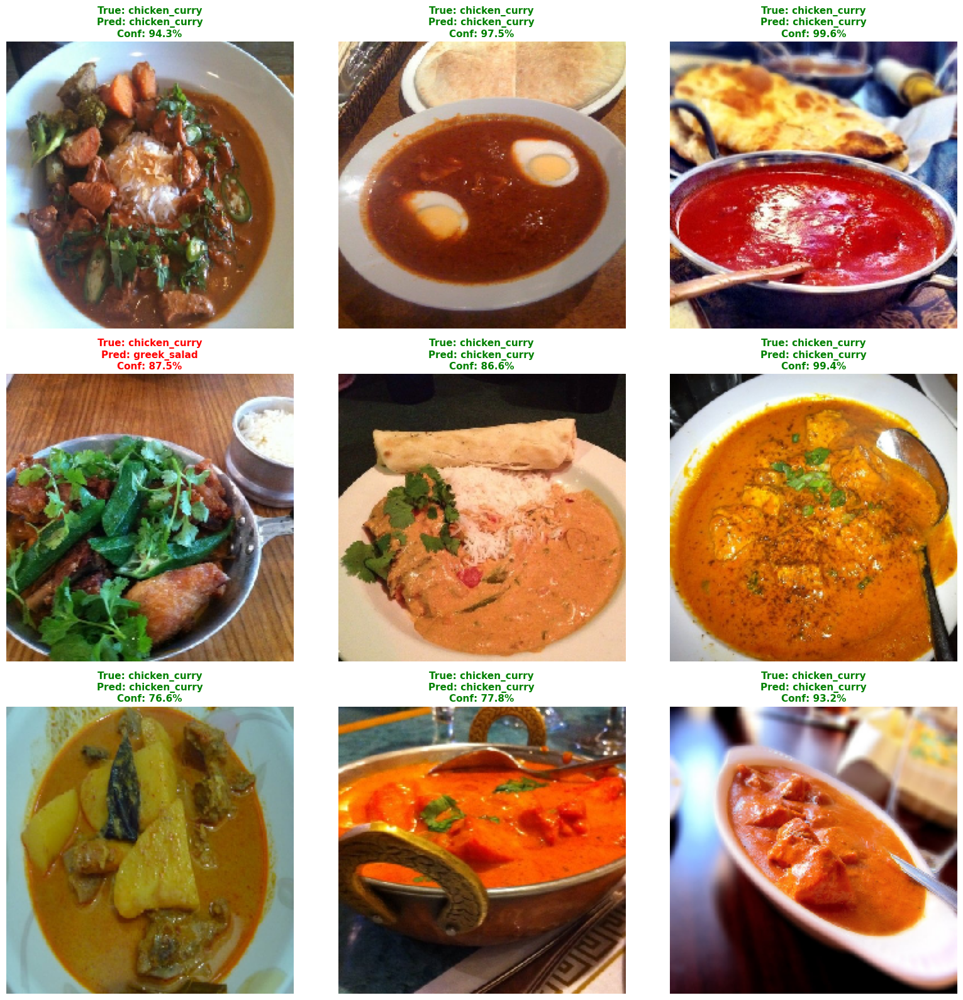

In [ ]:
def plot_predictions(generator, model, num_images=9):
    generator.reset()
    x_batch, y_batch = next(generator)
    predictions = model.predict(x_batch, verbose=0)

    plt.figure(figsize=(16, 16))
    for i in range(min(num_images, len(x_batch))):
        plt.subplot(3, 3, i + 1)
        plt.imshow(x_batch[i])

        true_class = idx_to_class[np.argmax(y_batch[i])]
        pred_class = idx_to_class[np.argmax(predictions[i])]
        confidence = np.max(predictions[i]) * 100

        color = 'green' if true_class == pred_class else 'red'
        plt.title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.1f}%",
                 color=color, fontsize=11, fontweight='bold')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

print("Приклади передбачень на тестових даних:\n")
plot_predictions(test_generator, model, num_images=9)

## 16. Аналіз помилок


АНАЛІЗ ПОМИЛОК
Правильних передбачень:   671 (89.47%)
Неправильних передбачень: 79 (10.53%)

Найбільш впевнені помилки (модель була впевнена, але помилилась):



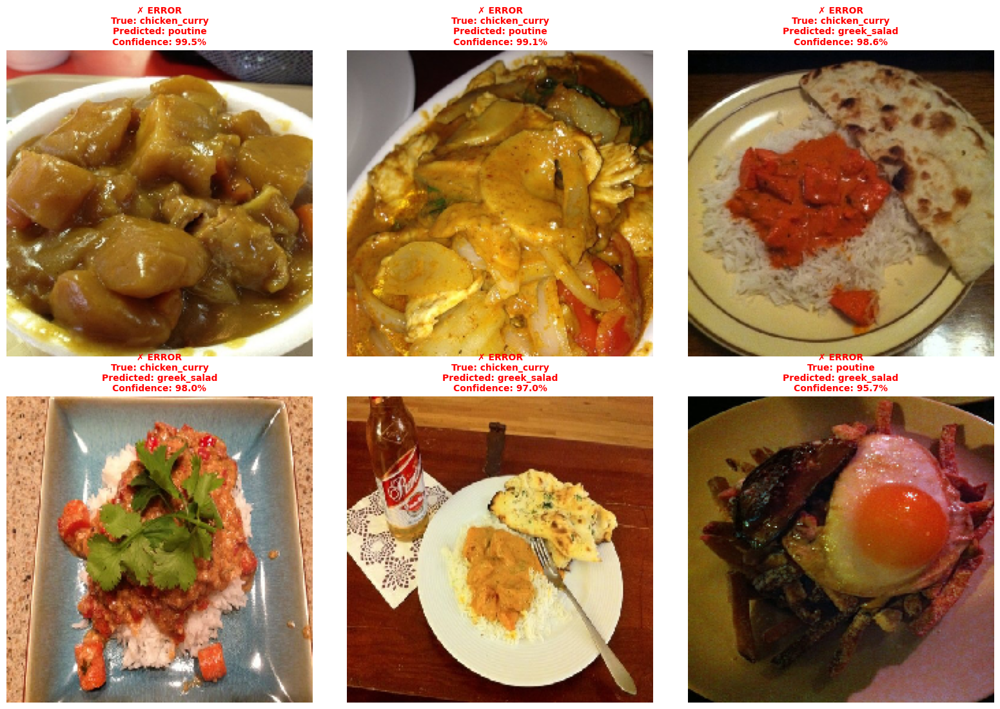

In [ ]:
correct_predictions = []
incorrect_predictions = []

for i in range(len(y_true)):
    confidence = np.max(predictions[i])
    if y_true[i] == y_pred[i]:
        correct_predictions.append((i, confidence))
    else:
        incorrect_predictions.append((i, confidence))

correct_predictions.sort(key=lambda x: x[1], reverse=True)
incorrect_predictions.sort(key=lambda x: x[1], reverse=True)

print("\n" + "="*70)
print("АНАЛІЗ ПОМИЛОК")
print("="*70)
print(f"Правильних передбачень:   {len(correct_predictions)} ({len(correct_predictions)/len(y_true)*100:.2f}%)")
print(f"Неправильних передбачень: {len(incorrect_predictions)} ({len(incorrect_predictions)/len(y_true)*100:.2f}%)")
print("="*70)

if len(incorrect_predictions) > 0:
    print("\nНайбільш впевнені помилки (модель була впевнена, але помилилась):\n")

    plt.figure(figsize=(16, 11))
    num_errors = min(6, len(incorrect_predictions))

    for i in range(num_errors):
        idx, conf = incorrect_predictions[i]

        test_generator.reset()
        batch_idx = idx // test_generator.batch_size
        in_batch_idx = idx % test_generator.batch_size

        for _ in range(batch_idx + 1):
            x_batch, y_batch = next(test_generator)

        img = x_batch[in_batch_idx]
        true_label = idx_to_class[y_true[idx]]
        pred_label = idx_to_class[y_pred[idx]]

        plt.subplot(2, 3, i + 1)
        plt.imshow(img)
        plt.title(f"✗ ERROR\nTrue: {true_label}\nPredicted: {pred_label}\nConfidence: {conf*100:.1f}%",
                 color='red', fontsize=10, fontweight='bold')
        plt.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("\n🎉 Вітаємо! Модель не зробила жодної помилки!")